In [1]:
import sys, os
from pyprojroot import here

# spyder up to find the root
root = here(project_files=[".root"])

# append to path
sys.path.append(str(root))

In [2]:
import math
from pathlib import Path

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

# Altitools
from alti_tools._src.data.ssh import download_ssh_toy
from alti_tools._src.transforms import spatial, temporal
from alti_tools._src.viz import psd as psd_plots

import seaborn as sns
import corner

sns.set_context(context="talk", font_scale=0.7)

try:
    import powerspec as ps
except ModuleNotFoundError:
    !pip install powerspec
    import powerspec as ps  

import xarray as xr
import pandas as pd
from scipy import ndimage
import holoviews as hv
import xrft
from dask.diagnostics import ProgressBar

import tqdm

%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
from alti_tools._src.utils.files import list_all_files, check_list_equal_elem
from alti_tools._src.utils.files import check_if_directory, check_if_file

1. Download the Data
2. Check if all files are there
3. Load data for Training scenarios (1 NADIR, 4 NADIR, 1 SWOT, 1 SWOT + 4 NADIR)
4. Run experiment config for training
5. Run experiment config for evaluation

In [4]:
# TODO: download files from MEOM (given config)

# TODO: download files from AVISO (given config)

### Check Files

This is a simple script to ensure that all of the files necessary are there and available. In this dataset, we have two folders of files:
* `obs` - this refers to the pseudo-observations generated by the NADIR and SWOT tracks
* `ref` - this refers to the NATL60 free run simulation

In [4]:
from alti_tools._src.data.osse import check_osse_files

# check the NATL60 simulation files
ref_dir = "/Volumes/EMANS_HDD/data/dc20a_osse/dc_ref"
check_osse_files(ref_dir, None, "ref")

# check the psuedo-obs files
obs_dir = "/Volumes/EMANS_HDD/data/dc20a_osse/dc_obs"
check_osse_files(obs_dir, None, "obs")

### Experiments


* 1 NADIR
* 4 NADIR
* 1 SWOT
* 1 SWOT + 4 NADIR

In [5]:
from alti_tools._src.data.configs.natl60 import get_data_config

In [6]:
data_config = get_data_config()
data_config

nadir1:
- 2020a_SSH_mapping_NATL60_jason1.nc
nadir4:
- 2020a_SSH_mapping_NATL60_topex-poseidon_interleaved.nc
- 2020a_SSH_mapping_NATL60_envisat.nc
- 2020a_SSH_mapping_NATL60_geosat2.nc
- 2020a_SSH_mapping_NATL60_jason1.nc
swot1:
- 2020a_SSH_mapping_NATL60_karin_swot.nc
- 2020a_SSH_mapping_NATL60_nadir_swot.nc
swot1nadir1:
- 2020a_SSH_mapping_NATL60_karin_swot.nc
- 2020a_SSH_mapping_NATL60_nadir_swot.nc
- 2020a_SSH_mapping_NATL60_jason1.nc
swot1nadir4:
- 2020a_SSH_mapping_NATL60_karin_swot.nc
- 2020a_SSH_mapping_NATL60_nadir_swot.nc
- 2020a_SSH_mapping_NATL60_topex-poseidon_interleaved.nc
- 2020a_SSH_mapping_NATL60_envisat.nc
- 2020a_SSH_mapping_NATL60_geosat2.nc
- 2020a_SSH_mapping_NATL60_jason1.nc

In [16]:
from typing import List
import warnings
from dask.array.core import PerformanceWarning


def load_alongtrack_list(files: List[str], preprocess=None):
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=PerformanceWarning)
        # Note: there is an annoying performance memory due to the chunking
        ds = list()

        for ifile in files:
            ds.append(
                xr.open_dataset(ifile)
            )

    return ds

# ds = xr.open_mfdataset(files, combine='nested', concat_dim='time', parallel=True, preprocess=preprocess, engine="netcdf4")

Number of samples:

* NADIR1 - `52717`
* NADIR4 - `205_232`

In [7]:
from alti_tools._src.data.osse import load_alongtrack_parallel, get_obs_exp_files

In [38]:
def plot_demo_obs(ds, dc_ref, central_date, delta_t):

    tmin = central_date - delta_t
    tmax = central_date + delta_t

    
    if isinstance(ds, list):
        ist_of_dataset_sel = []
        for ids in ds:
            ds_sel = ids.sel(time=slice(tmin, tmax))
            list_of_dataset_sel.append(ds_sel)

        ds = list(list_of_dataset_sel)

    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    for ds in list_of_dataset_sel:
        plt.scatter(ds.lon % 360., ds.lat, c=ds.ssh_model, s=20, cmap='gist_stern')
    plt.xlabel('longitude', fontweight='bold')
    plt.ylabel('latitude', fontweight='bold')
    plt.title(f'SSH model @ altimeter track')
    plt.colorbar(orientation='horizontal')
    plt.subplot(122)
    plt.pcolormesh(dc_ref.lon % 360, dc_ref.lat, dc_ref.sossheig.sel(time=str(central_date)).mean(dim='time'),
                   cmap='gist_stern')
    plt.xlabel('longitude', fontweight='bold')
    plt.ylabel('latitude', fontweight='bold')
    plt.title(f'SSH model')
    plt.colorbar(orientation='horizontal')
    plt.show()

In [52]:
list(obs_files)

[PosixPath('/Volumes/EMANS_HDD/data/dc20a_osse/dc_obs/2020a_SSH_mapping_NATL60_topex-poseidon_interleaved.nc'),
 PosixPath('/Volumes/EMANS_HDD/data/dc20a_osse/dc_obs/2020a_SSH_mapping_NATL60_envisat.nc'),
 PosixPath('/Volumes/EMANS_HDD/data/dc20a_osse/dc_obs/2020a_SSH_mapping_NATL60_geosat2.nc'),
 PosixPath('/Volumes/EMANS_HDD/data/dc20a_osse/dc_obs/2020a_SSH_mapping_NATL60_jason1.nc')]

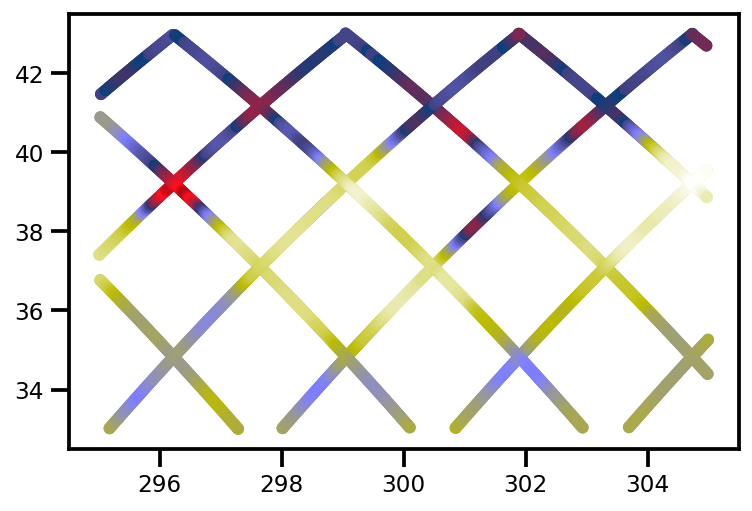

In [65]:
obs_files = get_obs_exp_files(obs_dir, "nadir1")

delta_t = np.timedelta64(10, "D") 
central_date = np.datetime64("2012-10-31")

tmin = central_date - delta_t
tmax = central_date + delta_t

plot_ds = list()

for ids in obs_files:
    # load data

    # subset
    ids = xr.load_dataset(ids).sel(time=slice(tmin, tmax))
    plot_ds.append(ids)

fig, ax = plt.subplots()

for ids in plot_ds:
    ax.scatter(ids.lon % 360, ids.lat, c=ids.ssh_model, s=20, cmap="gist_stern")

plt.show()

In [17]:
obs_files = get_obs_exp_files(obs_dir, "nadir1")
ds_nadir1 = load_alongtrack_parallel(obs_files)

obs_files = get_obs_exp_files(obs_dir, "nadir4")
ds_nadir4 = load_alongtrack_parallel(obs_files)

obs_files = get_obs_exp_files(obs_dir, "swot1")
ds_swot1= load_alongtrack_list(obs_files)

In [19]:
ds_swot1[1]

<xarray.Dataset>
Dimensions:      (time: 161333, cycle: 1)
Coordinates:
  * time         (time) datetime64[ns] 2012-10-03T18:04:15.403241 ... 2013-09...
Dimensions without coordinates: cycle
Data variables:
    lon          (time) float64 ...
    lat          (time) float64 ...
    x_al         (time) float32 ...
    ncycle       (cycle, time) timedelta64[ns] ...
    model_index  (time) float32 ...
    ssh_obs      (time) float64 ...
    ssh_model    (time) float64 ...
    nadir_err    (time) float64 ...
Attributes: (12/26)
    description:               SWOT fixed grid
    corresponding_grid:        /data/MSA_ETU/mballarotta/ETUDE_BOOST-SWOT/out...
    title:                     Altimeter like data simulated by SWOT simulator
    keywords:                  check keywords
    Conventions:               CF-1.6
    summary:                   SWOT grid data produced
    ...                        ...
    geospatial_lon_units:      degrees_east
    project:                   SWOT
    date_created:              2018-11-27T18:51:58Z
    date_modified:             2018-11-27T18:51:58Z
    keywords_vocabulary:       NASA
    references:                Gaultier, L., C. Ubelmann, and L.-L. Fu, 2016:...

In [76]:
ds_swot1[0].time.data.min(), ds_karin.time.data.max()

(numpy.datetime64('2012-10-02T18:03:42.401288000'),
 numpy.datetime64('2013-09-30T07:31:47.990844000'))

In [78]:
ds_karin

<xarray.Dataset>
Dimensions:      (time: 8412216)
Coordinates:
    z            (time) int64 0 0 0 0 0 0 0 0 0 0 ... 51 51 51 51 51 51 51 51 51
  * time         (time) datetime64[ns] 2012-10-02T18:03:42.401288 ... 2013-09...
Data variables: (12/14)
    lon          (time) float64 304.6 304.6 304.6 304.6 ... 295.3 295.3 295.3
    lat          (time) float64 42.99 42.97 42.95 42.93 ... 42.95 42.97 42.99
    x_al         (time) float32 1.001e+06 1.001e+06 ... 4.067e+06 4.067e+06
    x_ac         (time) float32 -60.0 -60.0 -60.0 -60.0 ... 60.0 60.0 60.0 60.0
    lon_nadir    (time) float64 305.3 305.3 305.3 305.3 ... 296.0 296.0 296.0
    lat_nadir    (time) float64 43.12 43.1 43.08 43.07 ... 42.82 42.84 42.86
    ...           ...
    ssh_obs      (time) float64 -0.3172 -0.2876 -0.2585 ... -0.2256 -0.2272
    roll_err     (time) float64 -0.09788 -0.09871 ... -0.002493 -7.4e-05
    phase_err    (time) float64 -0.1449 -0.1465 -0.1437 ... -0.1631 -0.1612
    ssh_model    (time) float64 -0.0222 -0.0152 -0.0093 ... -0.0579 -0.0582
    bd_err       (time) float64 8.2e-05 -0.001587 ... 0.008958 0.008257
    karin_err    (time) float64 -0.0345 -0.0082 0.008 ... 0.0221 -0.0007 -0.0073
Attributes: (12/26)
    description:               SWOT fixed grid
    corresponding_grid:        /data/MSA_ETU/mballarotta/ETUDE_BOOST-SWOT/out...
    title:                     SWOT-like data simulated by SWOT simulator
    keywords:                  SWOT, altimetry, SSH, satellite, remote sensing
    Conventions:               CF-1.6
    summary:                   SWOT grid data produced
    ...                        ...
    geospatial_lon_units:      degrees_east
    project:                   SWOT
    date_created:              2018-11-27T16:45:37Z
    date_modified:             2018-11-27T16:45:37Z
    keywords_vocabulary:       NASA
    references:                Gaultier, L., C. Ubelmann, and L.-L. Fu, 2016:...

In [80]:
ds_karin.sortby("time").sel(time=slice(tmin, tmax))

<xarray.Dataset>
Dimensions:      (time: 480708)
Coordinates:
    z            (time) int64 0 1 2 3 0 1 2 3 4 5 6 7 ... 3 4 5 6 7 0 1 2 3 4 0
  * time         (time) datetime64[ns] 2012-10-23T18:04:12.393963 ... 2012-11...
Data variables: (12/14)
    lon          (time) float64 304.6 304.6 304.6 304.7 ... 295.5 295.5 295.6
    lat          (time) float64 42.99 42.99 42.99 43.0 ... 42.99 43.0 43.0 43.0
    x_al         (time) float32 1.001e+06 1.001e+06 ... 1.01e+07 1.01e+07
    x_ac         (time) float32 -60.0 -58.0 -56.0 -54.0 ... -54.0 -52.0 -60.0
    lon_nadir    (time) float64 305.3 305.3 305.3 305.3 ... 294.8 294.8 294.8
    lat_nadir    (time) float64 43.12 43.12 43.12 43.12 ... 43.12 43.12 43.13
    ...           ...
    ssh_obs      (time) float64 -0.062 -0.042 -0.0494 ... 0.0215 0.0246 -0.0073
    roll_err     (time) float64 -0.1154 -0.1116 -0.1077 ... -0.004813 -0.005944
    phase_err    (time) float64 0.06866 0.06637 0.06408 ... 0.06532 0.07894
    ssh_model    (time) float64 -0.0096 -0.0116 -0.0136 ... -0.0514 -0.0477
    bd_err       (time) float64 0.009219 0.008615 0.008031 ... 0.01054 0.01352
    karin_err    (time) float64 -0.0198 0.0012 -0.0051 ... 0.0045 -0.0468
Attributes: (12/26)
    description:               SWOT fixed grid
    corresponding_grid:        /data/MSA_ETU/mballarotta/ETUDE_BOOST-SWOT/out...
    title:                     SWOT-like data simulated by SWOT simulator
    keywords:                  SWOT, altimetry, SSH, satellite, remote sensing
    Conventions:               CF-1.6
    summary:                   SWOT grid data produced
    ...                        ...
    geospatial_lon_units:      degrees_east
    project:                   SWOT
    date_created:              2018-11-27T16:45:37Z
    date_modified:             2018-11-27T16:45:37Z
    keywords_vocabulary:       NASA
    references:                Gaultier, L., C. Ubelmann, and L.-L. Fu, 2016:...

In [77]:
ds_swot1[0].sel(time=slice(tmin, tmax))


<xarray.Dataset>
Dimensions:      (nC: 52, time: 10751)
Coordinates:
  * nC           (nC) int64 0 1 2 3 4 5 6 7 8 9 ... 43 44 45 46 47 48 49 50 51
  * time         (time) datetime64[ns] 2012-10-23T18:04:12.393963 ... 2012-11...
Data variables: (12/14)
    lon          (nC, time) float64 304.6 304.6 304.6 304.6 ... nan nan nan nan
    lat          (nC, time) float64 42.99 42.97 42.95 42.93 ... nan nan nan nan
    x_al         (nC, time) float32 1.001e+06 1.001e+06 1.001e+06 ... nan nan
    x_ac         (nC, time) float32 -60.0 -60.0 -60.0 -60.0 ... nan nan nan nan
    lon_nadir    (nC, time) float64 305.3 305.3 305.3 305.3 ... nan nan nan nan
    lat_nadir    (nC, time) float64 43.12 43.1 43.08 43.07 ... nan nan nan nan
    ...           ...
    ssh_obs      (nC, time) float64 -0.062 -0.0351 -0.0546 ... nan nan nan
    roll_err     (nC, time) float64 -0.1154 -0.1102 -0.1136 ... nan nan nan
    phase_err    (nC, time) float64 0.06866 0.06041 0.07206 ... nan nan nan
    ssh_model    (nC, time) float64 -0.0096 -0.0083 -0.0069 ... nan nan nan
    bd_err       (nC, time) float64 0.009219 0.008807 0.009746 ... nan nan nan
    karin_err    (nC, time) float64 -0.0198 0.0096 -0.0204 ... nan nan nan
Attributes: (12/26)
    description:               SWOT fixed grid
    corresponding_grid:        /data/MSA_ETU/mballarotta/ETUDE_BOOST-SWOT/out...
    title:                     SWOT-like data simulated by SWOT simulator
    keywords:                  SWOT, altimetry, SSH, satellite, remote sensing
    Conventions:               CF-1.6
    summary:                   SWOT grid data produced
    ...                        ...
    geospatial_lon_units:      degrees_east
    project:                   SWOT
    date_created:              2018-11-27T16:45:37Z
    date_modified:             2018-11-27T16:45:37Z
    keywords_vocabulary:       NASA
    references:                Gaultier, L., C. Ubelmann, and L.-L. Fu, 2016:...

KeyError: Timestamp('2012-10-21 00:00:00')

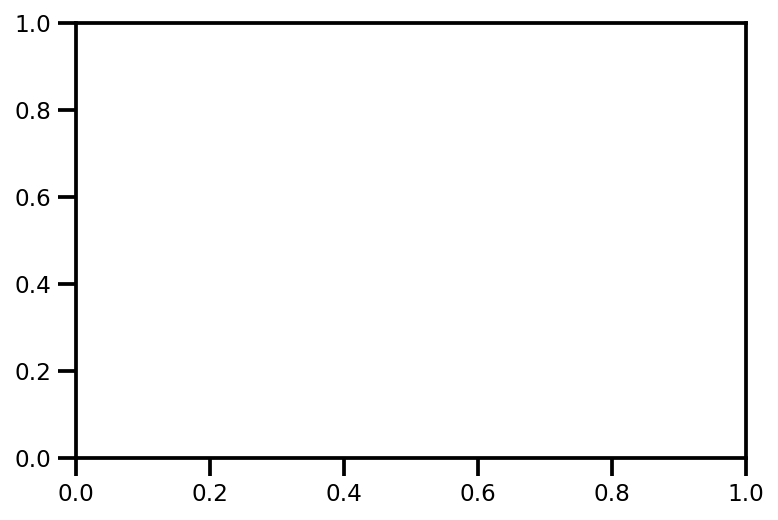

In [67]:
fig, ax = plt.subplots()
ax.scatter(
    ds_karin.sel(time=slice(tmin, tmax)).lon % 360, 
    ds_karin.sel(time=slice(tmin, tmax)).lat, 
    c=ds_karin.sel(time=slice(tmin, tmax)).ssh_model, 
    s=20, cmap="gist_stern")
plt.show()

In [ ]:
def preprocess_karin_swot(file_path):

    # stack data
    ds = xr.open_dataset(file_path)

    # stack data
    ds = ds.stack(z=("nC", "time")).dropna(dim="z").reset_index("time")

    # rename coordinate
    ds = ds.swap_dims({"z": "time"})

    ds = ds.sortby("time")

    ds.attrs["modification"] = "Emmanuel - did the reshaping to save to files for later."
    
    return ds

In [81]:
ds_karin = ds_swot1[0].stack(z=("nC", "time")).dropna(dim="z").reset_index("time")
ds_karin = ds_karin.swap_dims({"z": "time"})
ds_karin = ds_karin.sortby("time")

In [86]:
ds_karin.time.data.min(), ds_karin.time.data.max()


(numpy.datetime64('2012-10-02T18:03:42.401288000'),
 numpy.datetime64('2013-09-30T07:31:47.990844000'))

In [82]:
ds_karin

<xarray.Dataset>
Dimensions:      (time: 8412216)
Coordinates:
    z            (time) int64 0 1 2 3 0 1 2 3 4 5 6 7 ... 10 0 1 2 3 4 5 6 0 1 2
  * time         (time) datetime64[ns] 2012-10-02T18:03:42.401288 ... 2013-09...
Data variables: (12/14)
    lon          (time) float64 304.6 304.6 304.6 304.7 ... 296.8 296.8 296.7
    lat          (time) float64 42.99 42.99 42.99 43.0 ... 43.0 42.99 42.99 43.0
    x_al         (time) float32 1.001e+06 1.001e+06 ... 4.067e+06 4.067e+06
    x_ac         (time) float32 -60.0 -58.0 -56.0 -54.0 ... -60.0 -58.0 -56.0
    lon_nadir    (time) float64 305.3 305.3 305.3 305.3 ... 296.1 296.1 296.1
    lat_nadir    (time) float64 43.12 43.12 43.12 43.12 ... 43.12 43.12 43.12
    ...           ...
    ssh_obs      (time) float64 -0.3172 -0.2715 -0.2721 ... -0.1055 -0.114
    roll_err     (time) float64 -0.09788 -0.09462 -0.09135 ... -0.01051 -0.01015
    phase_err    (time) float64 -0.1449 -0.1401 -0.1352 ... -0.01958 -0.0189
    ssh_model    (time) float64 -0.0222 -0.022 -0.0215 ... -0.0821 -0.0816
    bd_err       (time) float64 8.2e-05 7.6e-05 7.1e-05 ... 0.0122 0.01137
    karin_err    (time) float64 -0.0345 0.0029 -0.0063 ... 0.0029 -0.0063
Attributes: (12/26)
    description:               SWOT fixed grid
    corresponding_grid:        /data/MSA_ETU/mballarotta/ETUDE_BOOST-SWOT/out...
    title:                     SWOT-like data simulated by SWOT simulator
    keywords:                  SWOT, altimetry, SSH, satellite, remote sensing
    Conventions:               CF-1.6
    summary:                   SWOT grid data produced
    ...                        ...
    geospatial_lon_units:      degrees_east
    project:                   SWOT
    date_created:              2018-11-27T16:45:37Z
    date_modified:             2018-11-27T16:45:37Z
    keywords_vocabulary:       NASA
    references:                Gaultier, L., C. Ubelmann, and L.-L. Fu, 2016:...

In [83]:
ds_karin.to_netcdf("/Volumes/EMANS_HDD/data/dc20a_osse/dc_obs_mod/2020a_SSH_mapping_NATL60_karin_swot.nc")

In [62]:
# ds_obs = load_obs_ds(obs_files)

In [41]:
from alti_tools._src.data.configs.natl60 import get_data_config

def get_obs_exp_files(obs_dir: str, experiment: str="nadir1") -> List[str]:
    """
    Experiments:
    * "nadir1"
    * "nadir4"
    * "swot1"
    * "swot1nadir1"
    * "swot1nadir4"
    """

    data_config = get_data_config()

    obs_files = list(map(lambda x: Path(obs_dir).joinpath(x), data_config[experiment]))

    return obs_files

In [33]:
experiments = ["nadir1", "nadir4", "swot1"]

# dataset directory
obs_dir = "/Volumes/EMANS_HDD/data/dc20a_osse/dc_obs"

for iexp in experiments:
    # open files from config
    obs_files = get_obs_exp_files(obs_dir, iexp)
    
    # load the files with xarray
    ds_obs = load_obs_ds(obs_files)


    n_files = 
    for ifile 
print(f"Experiment: {iexp.upper()} | Shape: {ds_obs.ssh_obs.shape}")

AttributeError: 'list' object has no attribute 'ssh_obs'

In [20]:
# dataset directory
obs_dir = "/Volumes/EMANS_HDD/data/dc20a_osse/dc_obs"

# create list of all filenames for experiment
experiment = "nadir4"
obs_files = list(map(lambda x: Path(obs_dir).joinpath(x), data_config[experiment]))
obs_files


[PosixPath('/Volumes/EMANS_HDD/data/dc20a_osse/dc_obs/2020a_SSH_mapping_NATL60_topex-poseidon_interleaved.nc'),
 PosixPath('/Volumes/EMANS_HDD/data/dc20a_osse/dc_obs/2020a_SSH_mapping_NATL60_envisat.nc'),
 PosixPath('/Volumes/EMANS_HDD/data/dc20a_osse/dc_obs/2020a_SSH_mapping_NATL60_geosat2.nc'),
 PosixPath('/Volumes/EMANS_HDD/data/dc20a_osse/dc_obs/2020a_SSH_mapping_NATL60_jason1.nc')]

In [25]:
preprocess = lambda x: x
ds_obs = xr.open_mfdataset(obs_files, combine='nested', concat_dim='time', parallel=True, preprocess=preprocess)

In [26]:
ds

<xarray.Dataset>
Dimensions:      (time: 205232, cycle: 1)
Coordinates:
  * time         (time) datetime64[ns] 2012-10-01T03:27:31.455335 ... 2013-09...
Dimensions without coordinates: cycle
Data variables:
    lon          (time) float64 dask.array<chunksize=(52162,), meta=np.ndarray>
    lat          (time) float64 dask.array<chunksize=(52162,), meta=np.ndarray>
    x_al         (time) float32 dask.array<chunksize=(52162,), meta=np.ndarray>
    ncycle       (time, cycle) timedelta64[ns] dask.array<chunksize=(52162, 1), meta=np.ndarray>
    model_index  (time) float32 dask.array<chunksize=(52162,), meta=np.ndarray>
    ssh_obs      (time) float64 dask.array<chunksize=(52162,), meta=np.ndarray>
    ssh_model    (time) float64 dask.array<chunksize=(52162,), meta=np.ndarray>
    nadir_err    (time) float64 dask.array<chunksize=(52162,), meta=np.ndarray>
Attributes: (12/26)
    description:               SWOT fixed grid
    corresponding_grid:        
    title:                     Altimeter like data simulated by SWOT simulator
    keywords:                  check keywords
    Conventions:               CF-1.6
    summary:                   SWOT grid data produced
    ...                        ...
    geospatial_lon_units:      degrees_east
    project:                   SWOT
    date_created:              2018-10-12T12:37:54Z
    date_modified:             2018-10-12T12:37:54Z
    keywords_vocabulary:       NASA
    references:                Gaultier, L., C. Ubelmann, and L.-L. Fu, 2016:...

In [44]:
# get all files indiscrimently
files_1 = list_all_files(directory, full_path=True)
print(files_1)

# get files with specific extension
files_2 = list_all_files(directory, ext="*.nc", full_path=True)
print(files_2)

# get file names with specific extensions
files_3 = list_all_files(directory, ext="*.nc", full_path=False)
print(files_3)


[PosixPath('/Volumes/EMANS_HDD/data/osse_oceanix/raw/sim/NATL60-CJM165_GULFSTREAM_ssh_y2013.1y.nc'), PosixPath('/Volumes/EMANS_HDD/data/osse_oceanix/raw/sim/NATL60-CJM165_GULFSTREAM_sss_y2013.1y.nc'), PosixPath('/Volumes/EMANS_HDD/data/osse_oceanix/raw/sim/NATL60-CJM165_GULFSTREAM_sst_y2013.1y.nc')]
[PosixPath('/Volumes/EMANS_HDD/data/osse_oceanix/raw/sim/NATL60-CJM165_GULFSTREAM_ssh_y2013.1y.nc'), PosixPath('/Volumes/EMANS_HDD/data/osse_oceanix/raw/sim/NATL60-CJM165_GULFSTREAM_sss_y2013.1y.nc'), PosixPath('/Volumes/EMANS_HDD/data/osse_oceanix/raw/sim/NATL60-CJM165_GULFSTREAM_sst_y2013.1y.nc')]
['NATL60-CJM165_GULFSTREAM_ssh_y2013.1y.nc', 'NATL60-CJM165_GULFSTREAM_sss_y2013.1y.nc', 'NATL60-CJM165_GULFSTREAM_sst_y2013.1y.nc']


In [41]:
set(files_1, files_2)

TypeError: set expected at most 1 argument, got 2

In [8]:
directory = Path("/Volumes/EMANS_HDD/data/osse_oceanix/raw/sim/")
files = [x for x in directory.glob("*.nc") if x.is_file()]

In [9]:
files

[PosixPath('/Volumes/EMANS_HDD/data/osse_oceanix/raw/sim/NATL60-CJM165_GULFSTREAM_ssh_y2013.1y.nc'),
 PosixPath('/Volumes/EMANS_HDD/data/osse_oceanix/raw/sim/NATL60-CJM165_GULFSTREAM_sss_y2013.1y.nc'),
 PosixPath('/Volumes/EMANS_HDD/data/osse_oceanix/raw/sim/NATL60-CJM165_GULFSTREAM_sst_y2013.1y.nc')]

In [10]:
# simulation dataset
ref_ds = xr.open_dataset("/Volumes/EMANS_HDD/data/osse_oceanix/raw/sim/NATL60-CJM165_GULFSTREAM_ssh_y2013.1y.nc", decode_times=False).assign_coords(time=lambda ds: pd.to_datetime(ds.time))

# Pseudo-Observations
obs_ds = xr.open_dataset('/Volumes/EMANS_HDD/data/osse_oceanix/raw/obs/dataset_nadir_0d_swot.nc')

# DUACS dataset
oi_ds = xr.open_dataset('/Volumes/EMANS_HDD/data/osse_oceanix/raw/results/duacs/ssh_NATL60_swot_4nadir.nc')

In [11]:
ref_ds

<xarray.Dataset>
Dimensions:  (time: 365, lat: 201, lon: 201)
Coordinates:
  * lon      (lon) float64 -65.0 -64.95 -64.9 -64.85 ... -55.1 -55.05 -55.0
  * lat      (lat) float64 33.0 33.05 33.1 33.15 33.2 ... 42.85 42.9 42.95 43.0
  * time     (time) datetime64[ns] 2012-10-01 2012-10-02 ... 2013-09-30
Data variables:
    ssh      (time, lat, lon) float64 ...

In [12]:
obs_ds

<xarray.Dataset>
Dimensions:      (lat: 201, lon: 201, time: 365)
Coordinates:
  * lon          (lon) float64 -65.0 -64.95 -64.9 -64.85 ... -55.1 -55.05 -55.0
  * lat          (lat) float64 33.0 33.05 33.1 33.15 ... 42.85 42.9 42.95 43.0
  * time         (time) datetime64[ns] 2012-10-01 2012-10-02 ... 2013-09-30
Data variables:
    mask         (lat, lon) float64 ...
    lag          (time, lat, lon) float64 ...
    flag         (time, lat, lon) float64 ...
    ssh_obs      (time, lat, lon) float64 ...
    ssh_mod      (time, lat, lon) float64 ...
    anomaly_obs  (time, lat, lon) float64 ...
    anomaly_mod  (time, lat, lon) float64 ...

In [13]:
oi_ds

<xarray.Dataset>
Dimensions:  (time: 365, lat: 201, lon: 201)
Coordinates:
  * lon      (lon) float64 -65.0 -64.95 -64.9 -64.85 ... -55.1 -55.05 -55.0
  * lat      (lat) float64 33.0 33.05 33.1 33.15 33.2 ... 42.85 42.9 42.95 43.0
  * time     (time) datetime64[ns] 2012-10-01 2012-10-02 ... 2013-09-30
Data variables:
    ssh_mod  (time, lat, lon) float64 ...
    ssh_obs  (time, lat, lon) float64 ...

In [14]:
ds = xr.Dataset({
    'natl60': ref_ds.ssh,
    'oi': oi_ds.ssh_mod,
    'obs': obs_ds.ssh_mod,
})
ds


<xarray.Dataset>
Dimensions:  (lon: 201, lat: 201, time: 365)
Coordinates:
  * lon      (lon) float64 -65.0 -64.95 -64.9 -64.85 ... -55.1 -55.05 -55.0
  * lat      (lat) float64 33.0 33.05 33.1 33.15 33.2 ... 42.85 42.9 42.95 43.0
  * time     (time) datetime64[ns] 2012-10-01 2012-10-02 ... 2013-09-30
Data variables:
    natl60   (time, lat, lon) float64 ...
    oi       (time, lat, lon) float64 ...
    obs      (time, lat, lon) float64 ...

## Viz

### SSH Field

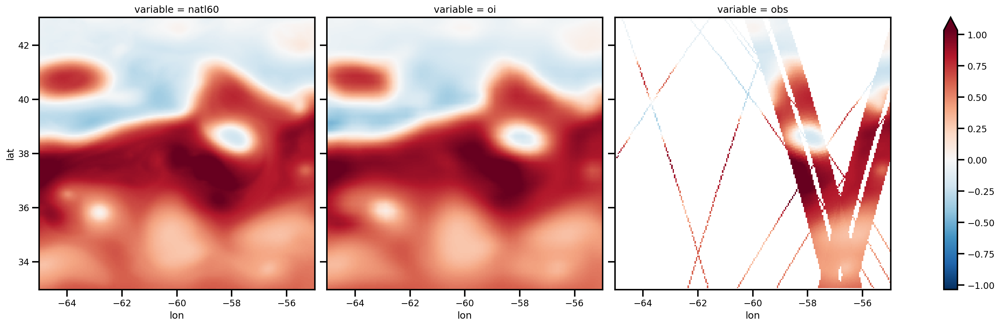

In [15]:
ds.to_array().isel(time=3).plot.pcolormesh(col='variable', figsize=(20, 6), robust=True)

### SSH Field Animation

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Layout
   .HoloMap.Natl60 :HoloMap   [time]
      :QuadMesh   [lon,lat]   (natl60)
   .HoloMap.Oi     :HoloMap   [time]
      :QuadMesh   [lon,lat]   (oi)
   .HoloMap.Obs    :HoloMap   [time]
      :QuadMesh   [lon,lat]   (obs)
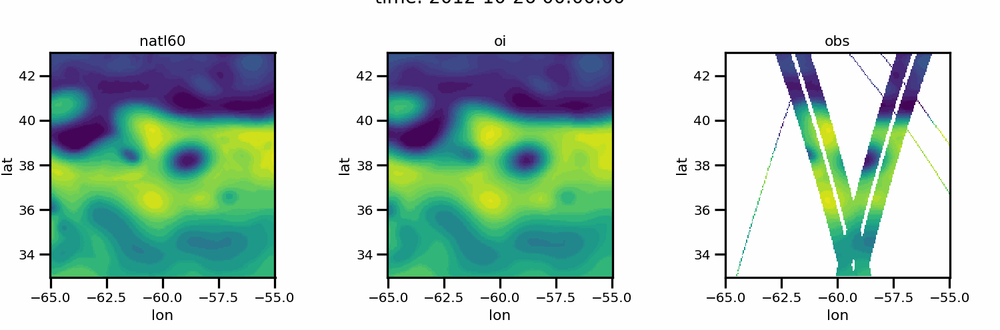

In [16]:
hv.extension('matplotlib')
f = lambda da: da.isel(time=slice(25, 55, 1))
ds = xr.Dataset({
    'natl60': ref_ds.ssh,
    'oi': oi_ds.ssh_mod,
    'obs': obs_ds.ssh_mod,
})
# to_plot_ds = {"natl60": f(ref_ds.ssh), "oi": f(oi_ds.ssh_mod), "obs": f(obs_ds.ssh_mod)}
# to_plot_ds = [f(ref_ds.ssh), f(oi_ds.ssh_mod), f(obs_ds.ssh_mod)]
to_plot_ds = ds.isel(time=slice(25, 55, 1))
clim = (
    to_plot_ds[["natl60", "oi"]]
    .to_array().pipe(lambda da: (da.quantile(0.005).item(), da.quantile(0.995).item()))
)
# clim=None
images = hv.Layout([
        hv.Dataset(to_plot_ds)
        .to(hv.QuadMesh, ['lon', 'lat'], v).relabel(v)
        .options(cmap='viridis', clim=clim)
        for v in to_plot_ds
]).cols(3).opts(sublabel_format="")

hv.output(images, holomap='gif', fps=2, dpi=125)

### Gradients

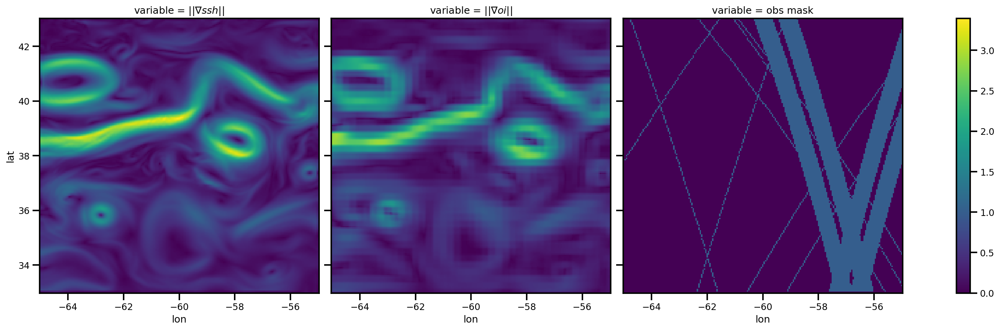

In [17]:
def sobel(da):
    dx = xr.apply_ufunc(lambda _da: ndimage.sobel(_da, -1), da)
    dy = xr.apply_ufunc(lambda _da: ndimage.sobel(_da, -2), da)
    return np.hypot(dx, dy)

grad_ds = xr.Dataset({
    r'||$\nabla ssh||$': ref_ds.ssh.pipe(sobel),
    r'||$\nabla oi||$': oi_ds.ssh_mod.pipe(sobel),
    'obs mask': np.isfinite(obs_ds.ssh_mod),
})
grad_ds.to_array().isel(time=3).plot.pcolormesh(col='variable', figsize=(20, 6), cmap='viridis')



### SSH Gradients Animation

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Layout
   .HoloMap.Vertical_line_vertical_line_reverse_over_nabla_ssh_vertical_line_vertical_line :HoloMap   [time]
      :QuadMesh   [lon,lat]   (||$\nabla ssh||$)
   .HoloMap.Vertical_line_vertical_line_reverse_over_nabla_oi_vertical_line_vertical_line  :HoloMap   [time]
      :QuadMesh   [lon,lat]   (||$\nabla oi||$)
   .HoloMap.Obs_mask                                                                       :HoloMap   [time]
      :QuadMesh   [lon,lat]   (obs mask)
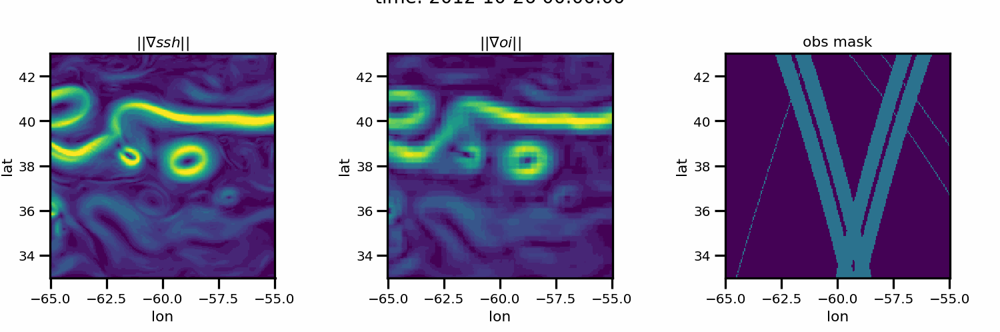

In [18]:
hv.extension('matplotlib')
to_plot_ds = grad_ds.isel(time=slice(25, 55, 1))

clim = (
    to_plot_ds[[r'||$\nabla ssh||$', r'||$\nabla oi||$']]
    .to_array().pipe(lambda da: (da.quantile(0.005).item(), da.quantile(0.995).item()))
)
images = hv.Layout([
        hv.Dataset(to_plot_ds)
        .to(hv.QuadMesh, ['lon', 'lat'], v).relabel(v)
        .options(cmap='viridis',clim=clim)
        for v in to_plot_ds
]).cols(3).opts(sublabel_format="")

hv.output(images, holomap='gif', fps=2, dpi=125)

